In [5]:
import sys
import numpy as np
import matplotlib.pyplot as plt
import dicom
import os
import scipy.ndimage
import cv2
import time
import scipy.misc
import caffe
import seaborn as sns

caffe_root = "./"
%matplotlib inline

size_image = (256, 216, 3)
sns.set_style("whitegrid", {'axes.grid' : False})

plt.rcParams['image.cmap'] = 'gray'

In [6]:
def softmax(x):
    """Compute softmax values for each sets of scores in x."""
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum()

# Read training set

In [ ]:
# rep_traininSet = "/home/luffy/Documents/Stage/dataSet_preprocess/Train/IRM/"
# rep_label = "/home/luffy/Documents/Stage/dataSet_preprocess/Train/Segment_GT/" 

rep_traininSet = "/home/luffy/Documents/Stage/caffe/data/Warwich_augmentedDataset/Train/imgs/"
rep_label = "/home/luffy/Documents/Stage/caffe/data/Warwich_augmentedDataset/Train/segs/" 

fileList = [f for f in list(os.walk(rep_traininSet))[0][2] if ".bmp" in f.lower()][:1000]

nb_image = 0
images = np.zeros((size_image[0], size_image[1], size_image[2], len(fileList)))
labels = np.zeros((size_image[0], size_image[1], len(fileList)))

for filename in fileList:
    images[:,:, :,nb_image] = scipy.misc.imread(rep_traininSet + filename)
    labels[:,:, nb_image] = scipy.misc.imread(rep_label + filename)
    nb_image += 1
            

# Read test set

In [ ]:
rep_testSet = "/home/luffy/Documents/Stage/caffe/data/Warwich_augmentedDataset/Train/imgs/"
rep_label_test = "/home/luffy/Documents/Stage/caffe/data/Warwich_augmentedDataset/Test/segs/"

fileList = [f for f in list(os.walk(rep_testSet))[0][2] if ".png" in f.lower()]

nb_image = 0
images_irm_test = np.zeros((size_image[0], size_image[1], size_image[2], len(fileList)))
labels_test = np.zeros((size_image[0], size_image[1], len(fileList)))

for filename in fileList:
    images_irm_test[:,:, :,nb_image] = scipy.misc.imread(rep_testSet + filename)
    labels_test[:,:, nb_image] = scipy.misc.imread(rep_label_test + filename)
    nb_image += 1
            

# Training alexnet

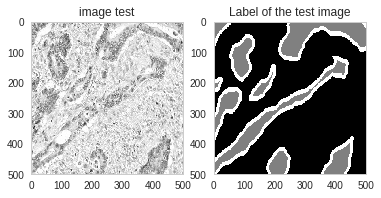

In [7]:
from IPython import display
import time 


caffe.set_device(0)
caffe.set_mode_gpu()
solver_name = caffe_root + "models/warwick_alexnet_topo/solver_alexnet_fcn_softmaxloss.prototxt"
solver = caffe.SGDSolver(solver_name)


# rep_model = "/media/luffy/DATA/Users/abdel/models_pretrained_rv_softmax/"
rep_model = "./"
weight_softmax = rep_model + 'train_alexnet_Topo_pretrained_softmax_iter_30000.caffemodel'
solver_softmax = rep_model + 'train_alexnet_Topo_pretrained_softmax_iter_22000.solverstate'
# solver.restore(solver_softmax)
# solver.net.copy_from(weight_softmax)

solver.step(1)

image_test = solver.test_nets[0].blobs["data"].data[0].transpose(1,2,0)
image_test_label = solver.test_nets[0].blobs["label"].data[0,:,:]
plt.subplot(1,2,1)
plt.imshow(image_test[:,:,0])
plt.title("image test")
plt.subplot(1,2,2)
plt.imshow(image_test_label)
plt.title("Label of the test image")

nb_step = 0

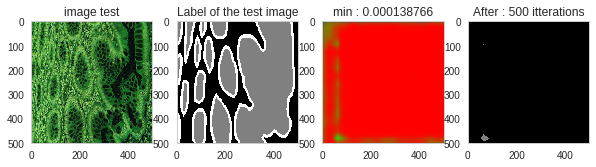

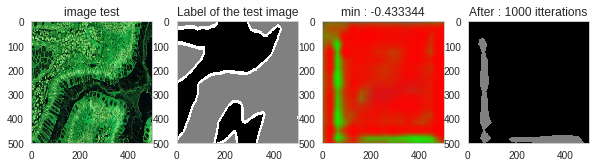

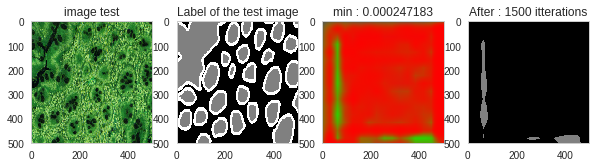

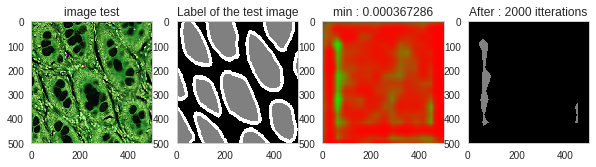

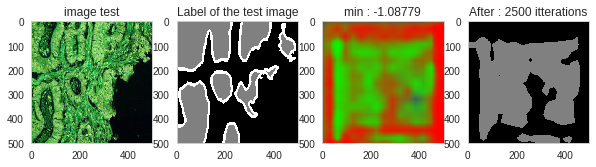

...

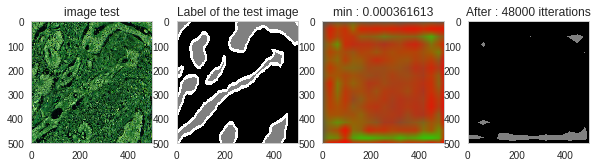

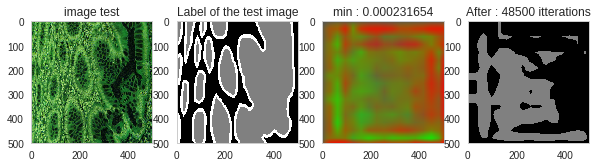

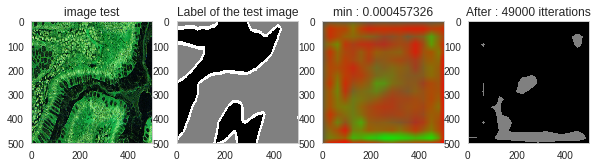

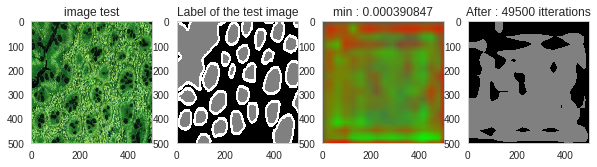

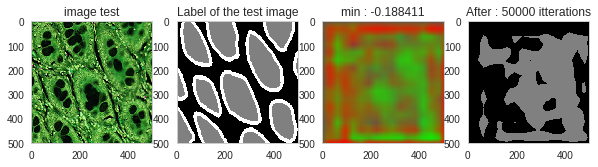

In [8]:
def normalize_heatmap(heatmap):
    heat_map_normalize = np.zeros(heat_map.shape)
    for x in range(heat_map.shape[0]):
        for y in range(heat_map.shape[1]):
            heat_map_normalize[x,y,:] = softmax(heat_map[x,y,:])
    
    return heat_map_normalize

step_size = 500
for i in range(20*5):
    solver.step(step_size)
    nb_step += step_size
    
    minimum = np.min(solver.test_nets[0].blobs["score-final"].data[0,:,:,:].transpose(1,2,0)[:,:,0])
    heat_map = solver.test_nets[0].blobs["score-final"].data[0,:,:,:].transpose(1,2,0)
    heat_map_normalize = normalize_heatmap(heat_map)
    
    
    plt.figure(figsize=(10,10))
    image_test = solver.test_nets[0].blobs["data"].data[0, :,:,:].transpose(1,2,0)
    image_test_label = solver.test_nets[0].blobs["label"].data[0, :,:]
    plt.subplot(1,4,1)
    plt.imshow(image_test)
    plt.title("image test")
    plt.subplot(1,4,2)
    plt.imshow(image_test_label)
    plt.title("Label of the test image")
    plt.subplot(1,4,3)
    plt.imshow(heat_map_normalize)
    plt.title("min : " + str(minimum))
    plt.subplot(1,4,4)
    plt.imshow(solver.test_nets[0].blobs["score-final"].data[0,:,:,:].transpose(1,2,0).argmax(2), vmin=0, vmax=2)
    plt.title("After : " + str(nb_step) + " itterations")
    display.display(plt.gcf())
    display.clear_output(wait=True)
    time.sleep(1)
    
#     print ("result : ", )


In [ ]:
# for each layer, show the output shape
for layer_name, blob in solver.net.blobs.iteritems():
    print layer_name + '\t' + str(blob.data.shape)

# Training fcn 16s

In [ ]:
from IPython import display
import time 

caffe.set_device(0)
caffe.set_mode_cpu()
solver_name = caffe_root + "models/fcn16s/solver.prototxt"
solver = caffe.SGDSolver(solver_name)

solver.step(1)

image_test = solver.test_nets[0].blobs["data"].data[0].transpose(1,2,0)
image_test_label = solver.test_nets[0].blobs["label"].data[0,0,:,:]
plt.subplot(1,2,1)
plt.imshow(image_test[:,:,0])
plt.title("image test")
plt.subplot(1,2,2)
plt.imshow(image_test_label)
plt.title("Label of the test image")

nb_step = 0

In [ ]:
step_size = 500
for i in range(20):
    solver.step(step_size)
    nb_step += step_size
    
    minimum = np.min(solver.test_nets[0].blobs["score"].data[0,:,:,:].transpose(1,2,0)[:,:,0])
    
    plt.figure(figsize=(10,10))
    image_test = solver.test_nets[0].blobs["data"].data[0].transpose(1,2,0)
    image_test_label = solver.test_nets[0].blobs["label"].data[0,0,:,:]
    plt.subplot(1,4,1)
    plt.imshow(image_test[:,:,0])
    plt.title("image test")
    plt.subplot(1,4,2)
    plt.imshow(image_test_label)
    plt.title("Label of the test image")
    plt.subplot(1,4,3)
    plt.imshow(solver.test_nets[0].blobs["score"].data[0,:,:,:].transpose(1,2,0))
    plt.title("min : " + str(minimum))
    plt.subplot(1,4,4)
    plt.imshow(solver.test_nets[0].blobs["score"].data[0,:,:,:].transpose(1,2,0).argmax(2), vmin=0, vmax=2)
    plt.title("After : " + str(nb_step) + " itterations")
    display.display(plt.gcf())
    display.clear_output(wait=True)
    time.sleep(1)

# Training FCN 32s

In [ ]:
from IPython import display
import time 

caffe.set_device(0)
caffe.set_mode_cpu()
solver_name = caffe_root + "models/fcn32s/solver.prototxt"
solver = caffe.SGDSolver(solver_name)
# rep_model_fcn32s = caffe_root + "./models/fcn32s/"
rep_model_fcn32s = caffe_root + "./snapshot/train/fcn32s/"
# weight_32s = rep_model_fcn32s + 'pascalcontext-fcn32s-heavy.caffemodel'
# solver.net.copy_from(weight_32s)
solver_32s = rep_model_fcn32s + 'train_fcn32s_Topo_pretrained_softmaxloss_iter_8000.solverstate'
solver.restore(solver_32s)

solver.step(1)

image_test = solver.test_nets[0].blobs["data"].data[0].transpose(1,2,0)
image_test_label = solver.test_nets[0].blobs["label"].data[0,0,:,:]
plt.subplot(1,2,1)
plt.imshow(image_test[:,:,0])
plt.title("image test")
plt.subplot(1,2,2)
plt.imshow(image_test_label)
plt.title("Label of the test image")

nb_step = 0

In [ ]:
step_size = 500
for i in range(20):
    solver.step(step_size)
    nb_step += step_size
    
    minimum = np.min(solver.test_nets[0].blobs["score"].data[0,:,:,:].transpose(1,2,0)[:,:,0])
    
    plt.figure(figsize=(10,10))
    image_test = solver.test_nets[0].blobs["data"].data[0].transpose(1,2,0)
    image_test_label = solver.test_nets[0].blobs["label"].data[0,0,:,:]
    plt.subplot(1,4,1)
    plt.imshow(image_test[:,:,0])
    plt.title("image test")
    plt.subplot(1,4,2)
    plt.imshow(image_test_label)
    plt.title("Label of the test image")
    plt.subplot(1,4,3)
    plt.imshow(solver.test_nets[0].blobs["score"].data[0,:,:,:].transpose(1,2,0))
    plt.title("min : " + str(minimum))
    plt.subplot(1,4,4)
    plt.imshow(solver.test_nets[0].blobs["score"].data[0,:,:,:].transpose(1,2,0).argmax(2), vmin=0, vmax=2)
    plt.title("After : " + str(nb_step) + " itterations")
    display.display(plt.gcf())
    display.clear_output(wait=True)
    time.sleep(1)

In [ ]:
solver.test_nets[0].blobs["score"].data[0,:,:,:].transpose(1,2,0).argmax(2)

In [ ]:
# for each layer, show the output shape
for layer_name, blob in solver.net.blobs.iteritems():
    print layer_name + '\t' + str(blob.data.shape)

# TEST alexnet

In [ ]:

caffe.set_device(0)
caffe.set_mode_gpu()
model_def = caffe_root + 'models/bvlc_alexnet_FCN_wTOPO/my_alexnet_fcn_deploy.prototxt'
# model_weights = caffe_root + 'models/bvlc_alexnet_FCN_wTOPO/alexnet_LT.caffemodel'
model_weights = caffe_root + 'train_alexnet_Topo_pretrained_softmax_iter_30000.caffemodel'


net = caffe.Net(model_def,      # defines the structure of the model
                model_weights, caffe.TEST)     # use test mode (e.g., don't perform dropout)


## Result on the training set

In [ ]:
import random

nb_images = images_irm.shape[3]
indices = list(range(nb_images))
images_to_test = indices[:100]

for num_image_train in images_to_test:
    img = images_irm[:,:,:,num_image_train].transpose(2,0,1)
    label = labels[:,:, num_image_train]

    net.blobs['data'].data[...] = img
    net.forward()
    
    out = net.blobs["score-final"].data[0,:,:,:].transpose(1,2,0)
    label_out = out.argmax(axis=2)
    
    plt.figure(figsize=(10,10))
    plt.subplot(1,3,1)
    plt.imshow(img.transpose(1,2,0)[:,:,0])
    plt.title("Orginial image")
    plt.subplot(1,3,2)
    plt.imshow(label, vmin=0, vmax=2)
    plt.title("Ground truth segmentation")
    plt.subplot(1,3,3)
    plt.imshow(label_out, vmin=0, vmax=2)
    plt.title("Segmentation predicted")

## Results on the test set

In [ ]:
# labels_test_predicted = np.zeros(images_irm_test.shape)

# for num_image_test in range(images_test_predicted.shape[2]):
#     img = images_irm_test[:,:,:,num_image_test].transpose(2,0,1)
#     label = labels_test[:,:, num_image_test]

#     net.blobs['data'].data[...] = img
#     net.forward()
    
#     out = net.blobs["score-final"].data[0,:,:,:].transpose(1,2,0)
#     labels_test_predicted[:,:,:,num_image_test] = out.argmax(axis=2)

In [ ]:
import random

nb_images = images_irm_test.shape[3]
indices = list(range(nb_images))
images_to_test = indices

for num_image_test in images_to_test:
    img = images_irm_test[:,:,:,num_image_test].transpose(2,0,1)
    label = labels_test[:,:, num_image_test]

    net.blobs['data'].data[...] = img
    net.forward()
    
    out = net.blobs["score-final"].data[0,:,:,:].transpose(1,2,0)
    label_out = out.argmax(axis=2)
    
    plt.figure(figsize=(10,10))
    plt.subplot(1,4,1)
    plt.imshow(img.transpose(1,2,0)[:,:,0], vmin=0, vmax=255)
    plt.title("Orginial image")
    plt.subplot(1,4,2)
    plt.imshow(label, vmin=0, vmax=2)
    plt.title("Ground truth segmentation")
    plt.subplot(1,4,3)
    plt.imshow(out)
    plt.title("Heat map")
    plt.subplot(1,4,4)
    plt.imshow(label_out, vmin=0, vmax=2)
    plt.title("Segmentation predicted")

### Depending on the number of itterations done

#### Load all the nets

In [ ]:
nb_itterations = [2000, 10000, 20000, 30000, 40000, 50000, 60000, 70000]

model_def = caffe_root + 'models/bvlc_alexnet_FCN_wTOPO/my_alexnet_fcn_deploy.prototxt'
# rep_model = "/media/luffy/DATA/Users/abdel/models_pretrained_rv_softmax/"

nets = []


caffe.set_device(0)
caffe.set_mode_cpu()
for nb_itter in nb_itterations:
    model_weights = rep_model + 'train_alexnet_Topo_pretrained_softmax_iter_' + str(nb_itter) +'.caffemodel'
    net = caffe.Net(model_def,      # defines the structure of the model
                model_weights, caffe.TEST)     # use test mode (e.g., don't perform dropout)
    nets.append(net)

In [ ]:
nbs_nets = len(nets)
nb_columns_display = 2 + nbs_nets

for num_image_test in range(images_irm_test.shape[3]):
    img = images_irm_test[:,:,:,num_image_test].transpose(2,0,1)
    label = labels_test[:,:, num_image_test]

    plt.figure(figsize=(30,30))
    plt.subplot(1,nb_columns_display,1)
    plt.imshow(img.transpose(1,2,0)[:,:,0], vmin=0, vmax=255)
    plt.title("Orginial image")
    plt.subplot(1,nb_columns_display,2)
    plt.imshow(label, vmin=0, vmax=2)
    plt.title("Ground truth segmentation")
    for i, net in enumerate(nets):
        net.blobs['data'].data[...] = img
        net.forward()
        out = net.blobs["score-final"].data[0,:,:,:].transpose(1,2,0)
        label_out = out.argmax(axis=2)
        plt.subplot(1,nb_columns_display,2+i+1)
        plt.imshow(label_out, vmin=0, vmax=2)
        plt.title("Segmentation predicted after " + str (nb_itterations[i]))

#### Pixel wise accuaracy depending on the number of itterations done

In [ ]:
accuaracy_depending_nbItterations = np.zeros(len(nets), dtype=np.float)

for num_image_test in range(images_irm_test.shape[3]):
    img = images_irm_test[:,:,:,num_image_test].transpose(2,0,1)
    label = labels_test[:,:, num_image_test]
    for i, net in enumerate(nets):
        net.blobs['data'].data[...] = img
        net.forward()
        out = net.blobs["score-final"].data[0,:,:,:].transpose(1,2,0)
        label_predicted = out.argmax(axis=2)
        accuaracy_depending_nbItterations[i] += np.sum((label == label_predicted).astype(int))/float(label.size)

accuaracy_depending_nbItterations /= images_irm_test.shape[3]
        

In [ ]:
plt.plot(nb_itterations, accuaracy_depending_nbItterations)
plt.title("Pixel wise accuaracy depending on the number of itterations done")

In [ ]:
# for each layer, show the output shape
for layer_name, blob in net.blobs.iteritems():
    print layer_name + '\t' + str(blob.data.shape)